In [3]:
import geopandas as gpd 
import pandas as pd
import os

In [9]:
uf = gpd.read_file(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Aula05\BR_UF_2022.shp")

In [10]:
uf.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry
0,12,Acre,AC,Norte,164173.429,"POLYGON ((-68.79282 -10.99957, -68.79367 -10.9..."
1,13,Amazonas,AM,Norte,1559255.881,"POLYGON ((-56.76292 -3.23221, -56.76789 -3.242..."
2,15,Pará,PA,Norte,1245870.704,"MULTIPOLYGON (((-48.97548 -0.19834, -48.97487 ..."
3,16,Amapá,AP,Norte,142470.762,"MULTIPOLYGON (((-51.04561 -0.05088, -51.05422 ..."
4,17,Tocantins,TO,Norte,277423.627,"POLYGON ((-48.2483 -13.19239, -48.24844 -13.19..."


<Axes: >

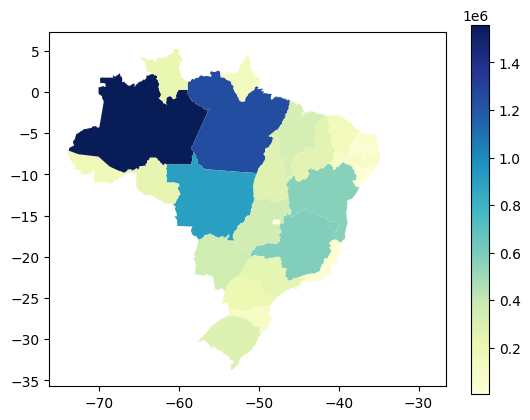

In [20]:
uf.plot(column="AREA_KM2", cmap='YlGnBu', legend=True)

<Axes: >

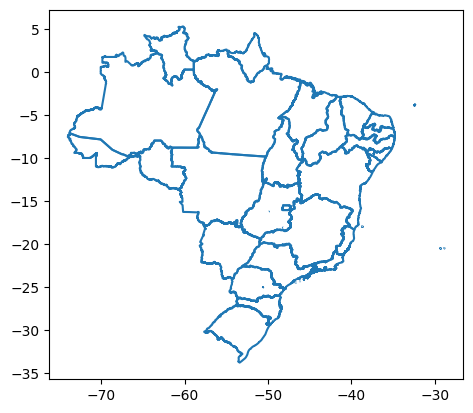

In [16]:
uf.boundary.plot()

In [21]:
uf.columns

Index(['CD_UF', 'NM_UF', 'SIGLA_UF', 'NM_REGIAO', 'AREA_KM2', 'geometry'], dtype='object')

In [22]:
uf['NM_REGIAO']

0              Norte
1              Norte
2              Norte
3              Norte
4              Norte
5         Nordeste\n
6         Nordeste\n
7         Nordeste\n
8         Nordeste\n
9         Nordeste\n
10        Nordeste\n
11        Nordeste\n
12        Nordeste\n
13        Nordeste\n
14         Sudeste\n
15         Sudeste\n
16         Sudeste\n
17         Sudeste\n
18             Sul\n
19             Sul\n
20             Sul\n
21    Centro-oeste\n
22    Centro-oeste\n
23    Centro-oeste\n
24    Centro-oeste\n
25             Norte
26             Norte
Name: NM_REGIAO, dtype: object

In [23]:
nordeste = uf[uf["NM_REGIAO"] == "Nordeste\n"]

<Axes: >

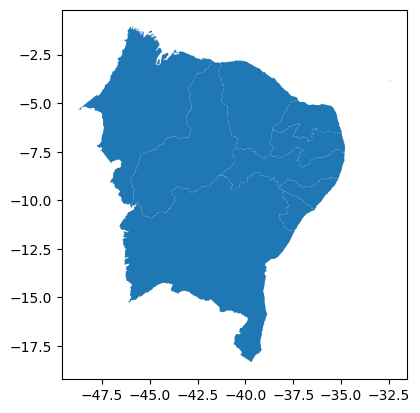

In [24]:
nordeste.plot()

In [25]:
nordeste.to_file("Nordeste.shp")

In [26]:
nordeste = gpd.read_file(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Aula05\Nordeste.shp")

<Axes: >

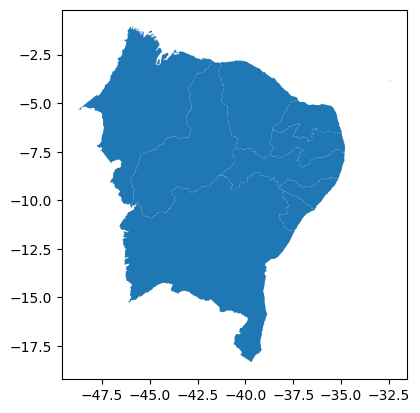

In [27]:
nordeste.plot()

In [28]:
nordeste.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry
0,21,Maranhão,MA,Nordeste\n,329651.496,"MULTIPOLYGON (((-44.5868 -2.23341, -44.58696 -..."
1,22,Piauí,PI,Nordeste\n,251755.481,"POLYGON ((-42.47034 -3.48377, -42.46126 -3.484..."
2,23,Ceará,CE,Nordeste\n,148894.447,"POLYGON ((-37.87162 -4.3664, -37.87109 -4.3670..."
3,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,"MULTIPOLYGON (((-35.18728 -5.78987, -35.18707 ..."
4,25,Paraíba,PB,Nordeste\n,56467.242,"MULTIPOLYGON (((-34.7958 -7.175, -34.79578 -7...."


In [29]:
print(nordeste.crs)

EPSG:4674


In [30]:
nordeste["area_teste"] = nordeste.area

C:\Users\Lucas\AppData\Local\Temp\ipykernel_31360\1236095700.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nordeste["area_teste"] = nordeste.area


In [43]:
nordeste = nordeste.to_crs(31984)

In [44]:
print(nordeste.crs)

EPSG:31984


<Axes: >

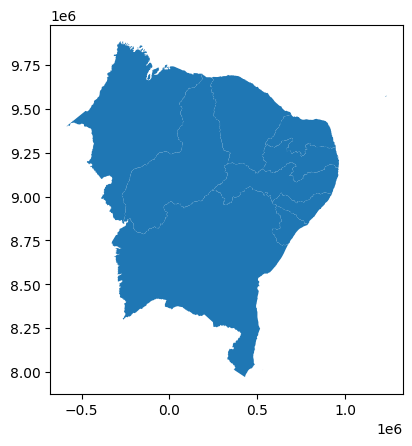

In [45]:
nordeste.plot()

In [46]:
nordeste["area_teste"] = nordeste.area

In [47]:
nordeste.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry,area_teste
0,21,Maranhão,MA,Nordeste\n,329651.496,"MULTIPOLYGON (((-122191.775 9751954.664, -1222...",3.335600e+11
1,22,Piauí,PI,Nordeste\n,251755.481,"POLYGON ((114311.606 9614223.155, 115322.253 9...",2.528979e+11
2,23,Ceará,CE,Nordeste\n,148894.447,"POLYGON ((625206.292 9517277.944, 625265.606 9...",1.488272e+11
3,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,"MULTIPOLYGON (((922418.093 9358604.565, 922440...",5.286571e+10
4,25,Paraíba,PB,Nordeste\n,56467.242,"MULTIPOLYGON (((964590.284 9204773.399, 964591...",5.652163e+10


<Axes: >

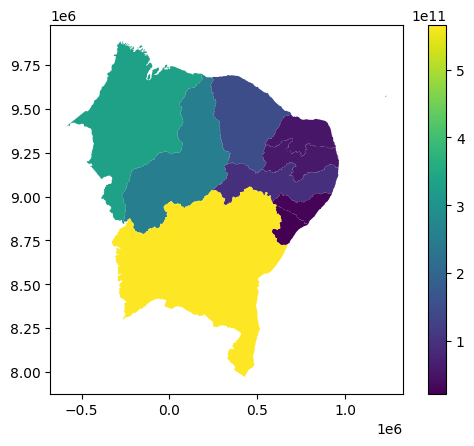

In [48]:
nordeste.plot("area_teste", legend=True)

In [49]:
import folium
import matplotlib as mpl
import mapclassify as mc

nordeste.explore("area_teste", legend=False)

In [50]:
nordeste["centroid"] = nordeste.centroid

In [51]:
nordeste.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry,area_teste,centroid
0,21,Maranhão,MA,Nordeste\n,329651.496,"MULTIPOLYGON (((-122191.775 9751954.664, -1222...",3.335600e+11,POINT (-198567.516 9435966.171)
1,22,Piauí,PI,Nordeste\n,251755.481,"POLYGON ((114311.606 9614223.155, 115322.253 9...",2.528979e+11,POINT (61816.641 9181111.418)
2,23,Ceará,CE,Nordeste\n,148894.447,"POLYGON ((625206.292 9517277.944, 625265.606 9...",1.488272e+11,POINT (431659.541 9437206.802)
3,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,"MULTIPOLYGON (((922418.093 9358604.565, 922440...",5.286571e+10,POINT (757773.332 9353936.944)
4,25,Paraíba,PB,Nordeste\n,56467.242,"MULTIPOLYGON (((964590.284 9204773.399, 964591...",5.652163e+10,POINT (739597.027 9212217.482)


In [57]:
nordeste = nordeste.set_geometry("centroid")
nordeste = nordeste.set_geometry("geometry")


<Axes: >

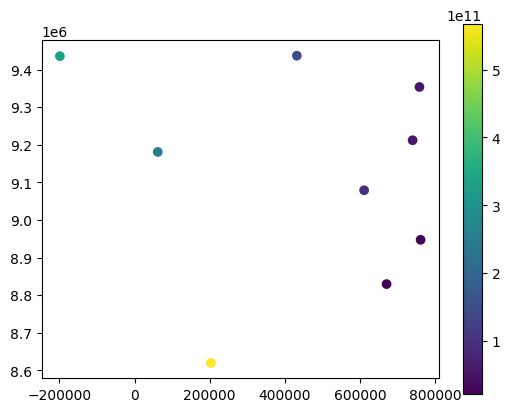

In [53]:
nordeste.plot('area_teste', legend=True)

<Axes: >

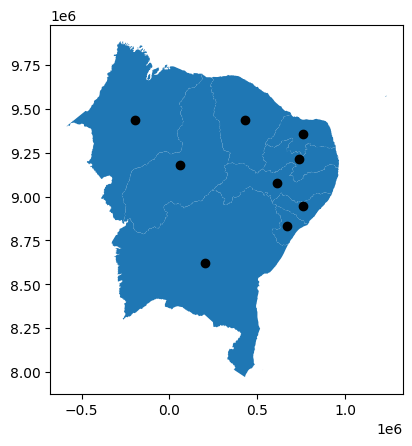

In [54]:
axis = nordeste["geometry"].plot()
nordeste["centroid"].plot(ax=axis, color="black")

In [55]:
import matplotlib.pyplot as plt

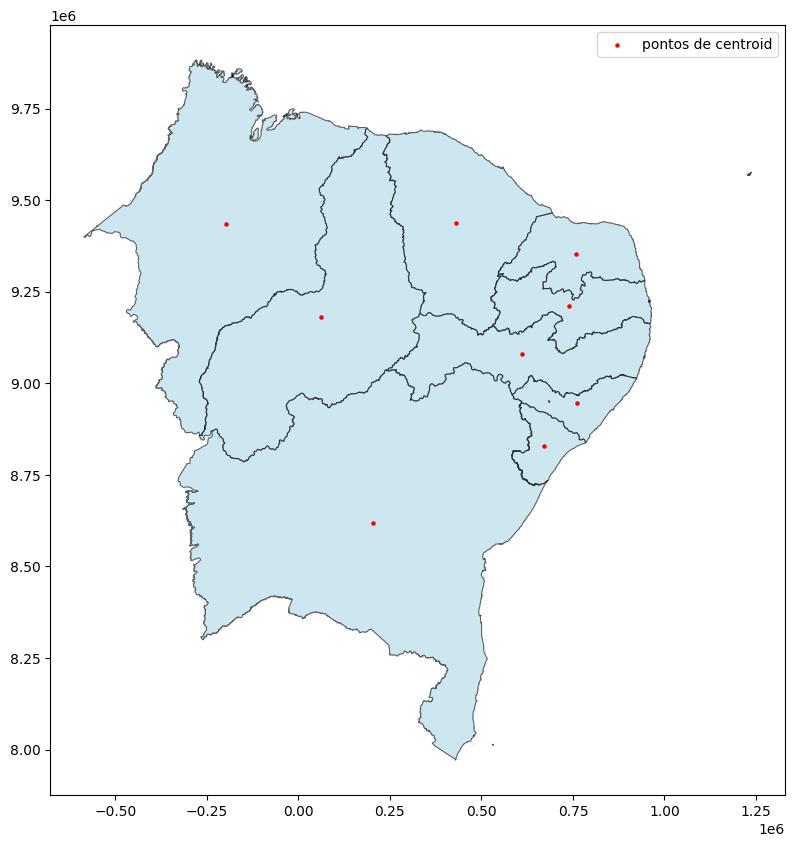

In [59]:
# Criar o gráfico
fig, ax = plt.subplots(figsize=(10, 10))

# Plotar as geometrias (polígonos)
nordeste.plot(ax=ax, color='lightblue', edgecolor='black', linewidth=0.8, alpha=0.6)

# Plotar os centroides em cima dos polígonos
nordeste['centroid'].plot(ax=ax, color='red', marker='o', markersize=5, label='pontos de centroid')

# Adicionar uma legenda
plt.legend()

# Mostrar o gráfico
plt.show()

In [ ]:
# Aula sobre arrays

In [60]:
import numpy as np

In [62]:
lista = [1, 2, 3, 4, 5]
print(lista)

[1, 2, 3, 4, 5]


In [63]:
array = np.array(lista)

In [64]:
print(array)

[1 2 3 4 5]


In [66]:
arrays_uns = np.ones(5)
print(arrays_uns)

[1. 1. 1. 1. 1.]


In [67]:
array_espacado = np.arange(0, 20, 2)
print(array_espacado)

[ 0  2  4  6  8 10 12 14 16 18]


In [68]:
array_espacado[9] = 20

In [69]:
print(array_espacado)

[ 0  2  4  6  8 10 12 14 16 20]


In [71]:
array_espacado = array_espacado * 3 
print(array_espacado)

[ 3  9 15 21 27 33 39 45 51 63]


In [72]:
raiz = np.sqrt(array_espacado)

In [73]:
print(raiz)

[1.73205081 3.         3.87298335 4.58257569 5.19615242 5.74456265
 6.244998   6.70820393 7.14142843 7.93725393]


In [74]:
matriz = np.array([[1, 2, 4], [3, 4, 5]])

In [75]:
print(matriz)

[[1 2 4]
 [3 4 5]]


In [79]:
print(matriz[1, 1])

4


In [80]:
transpor_matriz = matriz.T

In [81]:
print(transpor_matriz)

[[1 3]
 [2 4]
 [4 5]]


In [82]:
nordeste.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry,area_teste,centroid
0,21,Maranhão,MA,Nordeste\n,329651.496,"MULTIPOLYGON (((-122191.775 9751954.664, -1222...",3.335600e+11,POINT (-198567.516 9435966.171)
1,22,Piauí,PI,Nordeste\n,251755.481,"POLYGON ((114311.606 9614223.155, 115322.253 9...",2.528979e+11,POINT (61816.641 9181111.418)
2,23,Ceará,CE,Nordeste\n,148894.447,"POLYGON ((625206.292 9517277.944, 625265.606 9...",1.488272e+11,POINT (431659.541 9437206.802)
3,24,Rio Grande do Norte,RN,Nordeste\n,52809.599,"MULTIPOLYGON (((922418.093 9358604.565, 922440...",5.286571e+10,POINT (757773.332 9353936.944)
4,25,Paraíba,PB,Nordeste\n,56467.242,"MULTIPOLYGON (((964590.284 9204773.399, 964591...",5.652163e+10,POINT (739597.027 9212217.482)


EPSG:31984


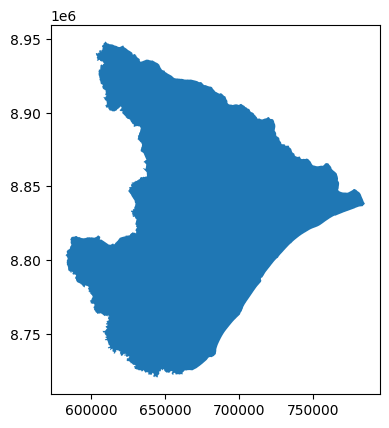

In [85]:
sergipe = nordeste[nordeste['NM_UF'] == 'Sergipe']
sergipe.plot()
print(sergipe.crs)

In [86]:
sergipe.head()

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,AREA_KM2,geometry,area_teste,centroid
7,28,Sergipe,SE,Nordeste\n,21938.188,"MULTIPOLYGON (((717267.23 8791284.289, 717195....",2.193727e+10,POINT (670288.841 8829678.124)


In [87]:
sergipe = gpd.read_file(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Aula05\SE_Municipios_2022.shp")

In [88]:
sergipe.head()

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
0,2800100,Amparo do São Francisco,SE,35.683,"POLYGON ((-36.9269 -10.12572, -36.92631 -10.12..."
1,2800209,Aquidabã,SE,359.543,"POLYGON ((-37.0169 -10.19101, -36.99479 -10.17..."
2,2800308,Aracaju,SE,182.163,"POLYGON ((-37.03564 -10.95968, -37.03583 -10.9..."
3,2800407,Arauá,SE,198.967,"MULTIPOLYGON (((-37.65625 -11.34042, -37.65625..."
4,2800506,Areia Branca,SE,148.134,"POLYGON ((-37.31622 -10.74069, -37.31518 -10.7..."


In [89]:
pop_sergipe = pd.read_csv(r"C:\_Repositorios\CienciaDeDadoseAnaliseGeoestatisticaComGeoprocessamento\Aula05\se_pop_2022.csv")

In [90]:
pop_sergipe.head()

,Município,Gentílico,População (Último Censo)
0,Amparo do São Francisco,sergipano/sergipense,2170
1,Aquidabã,sergipano/sergipense,20131
2,Aracaju,sergipano/sergipense,602757
3,Arauá,sergipano/sergipense,10318
4,Areia Branca,sergipano/sergipense,18081


In [91]:
pop_sergipe.rename(columns={"Município": "NM_MUN"}, inplace=True)

In [96]:
pop_sergipe.info

<bound method DataFrame.info of                      NM_MUN             Gentílico  População (Último Censo)
0   Amparo do São Francisco  sergipano/sergipense                      2170
1                  Aquidabã  sergipano/sergipense                     20131
2                   Aracaju  sergipano/sergipense                    602757
3                     Arauá  sergipano/sergipense                     10318
4              Areia Branca  sergipano/sergipense                     18081
..                      ...                   ...                       ...
70                   Siriri  sergipano/sergipense                      7834
71                    Telha  sergipano/sergipense                      3274
72           Tobias Barreto  sergipano/sergipense                     50905
73            Tomar do Geru  sergipano/sergipense                     12012
74                  Umbaúba  sergipano/sergipense                     23917

[75 rows x 3 columns]>

In [93]:
merged_sergipe = gpd.GeoDataFrame(pd.merge(pop_sergipe, sergipe, on="NM_MUN", how="left"))

In [101]:
merged_sergipe.rename(columns={"População (Último Censo)": "popcenso"}, inplace=True)
merged_sergipe.head()

,NM_MUN,Gentílico,popcenso,CD_MUN,SIGLA_UF,AREA_KM2,geometry
0,Amparo do São Francisco,sergipano/sergipense,2170,2800100,SE,35.683,"POLYGON ((-36.9269 -10.12572, -36.92631 -10.12..."
1,Aquidabã,sergipano/sergipense,20131,2800209,SE,359.543,"POLYGON ((-37.0169 -10.19101, -36.99479 -10.17..."
2,Aracaju,sergipano/sergipense,602757,2800308,SE,182.163,"POLYGON ((-37.03564 -10.95968, -37.03583 -10.9..."
3,Arauá,sergipano/sergipense,10318,2800407,SE,198.967,"MULTIPOLYGON (((-37.65625 -11.34042, -37.65625..."
4,Areia Branca,sergipano/sergipense,18081,2800506,SE,148.134,"POLYGON ((-37.31622 -10.74069, -37.31518 -10.7..."


In [103]:
pop_municipio = merged_sergipe[["NM_MUN","popcenso"]]
print(pop_municipio)

                     NM_MUN  popcenso
0   Amparo do São Francisco      2170
1                  Aquidabã     20131
2                   Aracaju    602757
3                     Arauá     10318
4              Areia Branca     18081
..                      ...       ...
70                   Siriri      7834
71                    Telha      3274
72           Tobias Barreto     50905
73            Tomar do Geru     12012
74                  Umbaúba     23917

[75 rows x 2 columns]


In [105]:
arr_pop = pop_municipio.to_numpy()
print(arr_pop)

[['Amparo do São Francisco' 2170]
 ['Aquidabã' 20131]
 ['Aracaju' 602757]
 ['Arauá' 10318]
 ['Areia Branca' 18081]
 ['Barra dos Coqueiros' 41511]
 ['Boquim' 24636]
 ['Brejo Grande' 7841]
 ['Campo do Brito' 18149]
 ['Canhoba' 3791]
 ['Canindé de São Francisco' 26834]
 ['Capela' 31645]
 ['Carira' 19939]
 ['Carmópolis' 13853]
 ['Cedro de São João' 5391]
 ['Cristinápolis' 17100]
 ['Cumbe' 3824]
 ['Divina Pastora' 4340]
 ['Estância' 65078]
 ['Feira Nova' 5975]
 ['Frei Paulo' 14530]
 ['Gararu' 11096]
 ['General Maynard' 3037]
 ['Gracho Cardoso' 5834]
 ['Ilha das Flores' 8321]
 ['Indiaroba' 16549]
 ['Itabaiana' 103440]
 ['Itabaianinha' 40678]
 ['Itabi' 4745]
 ["Itaporanga d'Ajuda" 34411]
 ['Japaratuba' 16209]
 ['Japoatã' 13407]
 ['Lagarto' 101579]
 ['Laranjeiras' 23975]
 ['Macambira' 6838]
 ['Malhada dos Bois' 3579]
 ['Malhador' 11533]
 ['Maruim' 15719]
 ['Moita Bonita' 11050]
 ['Monte Alegre de Sergipe' 14336]
 ['Muribeca' 7822]
 ['Neópolis' 16426]
 ['Nossa Senhora Aparecida' 9232]
 ['Nossa 

In [106]:
arr_pop.shape

(75, 2)

In [107]:
arr_pop[0]

array(['Amparo do São Francisco', 2170], dtype=object)

In [108]:
sum_arr_pop = arr_pop[:,1].sum()

In [109]:
print(sum_arr_pop)

2210004


In [110]:
mean_arr_pop = arr_pop[:,1].mean()
print(mean_arr_pop)

29466.72
